In [50]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [51]:
from IPython.display import clear_output
!pip install tf_explain
clear_output()

In [17]:
import os
import keras
import numpy as np
import pandas as pd
from glob import glob
import tensorflow as tf
import tensorflow.image as tfi
from keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.utils import to_categorical
import matplotlib.pyplot as plt
from keras.models import Model
from keras.layers import Layer
from keras.layers import Conv2D
from keras.layers import Dropout
from keras.layers import UpSampling2D
from keras.layers import concatenate
from keras.layers import Add
from keras.layers import Multiply
from keras.layers import Input
from keras.layers import MaxPool2D
from keras.layers import BatchNormalization
from keras.callbacks import Callback
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint
from tf_explain.core.grad_cam import GradCAM
from keras.metrics import MeanIoU

In [18]:
def load_image(image, SIZE):
    return np.round(tfi.resize(img_to_array(load_img(image))/255.,(SIZE, SIZE)),4)
    
def load_images(image_paths, SIZE, mask=False, trim=None):
    if trim is not None:
        image_paths = image_paths[:trim]
    
    if mask:
        images = np.zeros(shape=(len(image_paths), SIZE, SIZE, 1))
    else:
        images = np.zeros(shape=(len(image_paths), SIZE, SIZE, 3))
    
    for i,image in enumerate(image_paths):
        img = load_image(image,SIZE)
        if mask:
            images[i] = img[:,:,:1]
        else:
            images[i] = img
    
    return images
    
def show_image(image, title=None, cmap=None, alpha=1):
    plt.imshow(image, cmap=cmap, alpha=alpha)
    # print(img.shape[-3:])
    if title is not None:
        plt.title(title)
    plt.axis('off')

def show_mask(image, mask, cmap=None, alpha=0.4):
    plt.imshow(image)
    # print(img.shape[-3:])
    plt.imshow(tf.squeeze(mask), cmap=cmap, alpha=alpha)
    plt.axis('off')

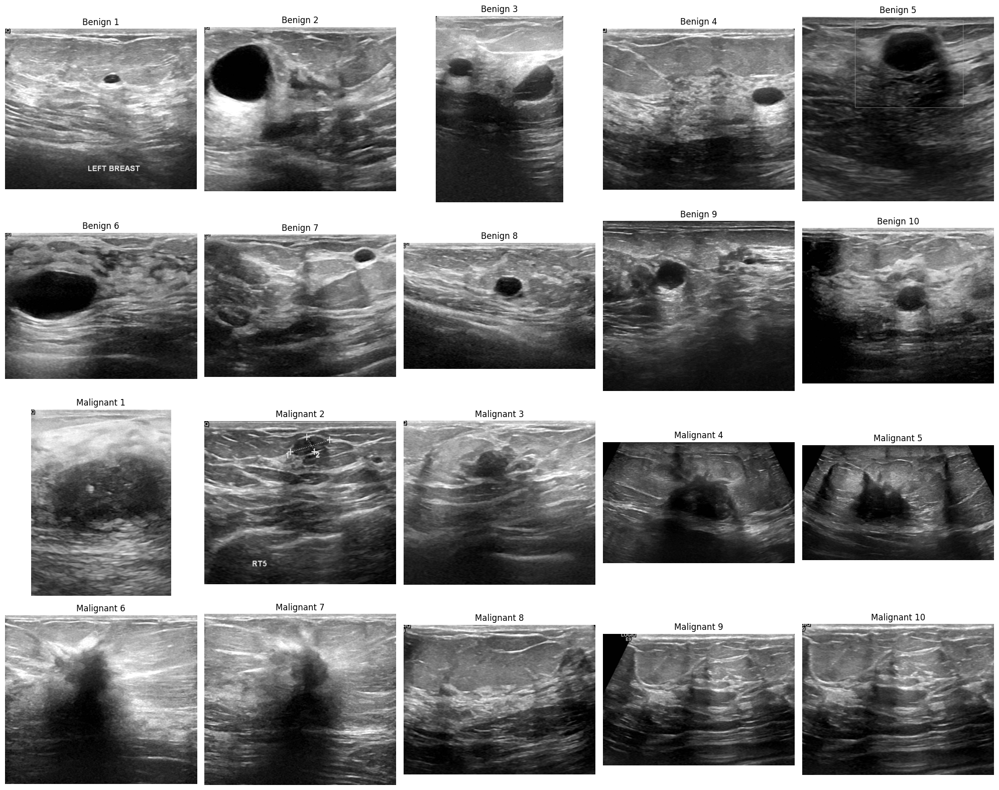

In [19]:
import matplotlib.pyplot as plt
import cv2
import glob
import os
import math

# Base paths
benign_path = "/kaggle/input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/benign/"
malignant_path = "/kaggle/input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/malignant/"

# Collect image paths
benign_imgs = sorted(glob.glob(os.path.join(benign_path, "*.png")))
malignant_imgs = sorted(glob.glob(os.path.join(malignant_path, "*.png")))

# Remove masks
benign_imgs = [f for f in benign_imgs if "_mask" not in f]
malignant_imgs = [f for f in malignant_imgs if "_mask" not in f]

# ✅ Choose how many images to display
num_samples = 10  # change to any number you like

# Limit to available samples
benign_imgs = benign_imgs[:num_samples]
malignant_imgs = malignant_imgs[:num_samples]

# ✅ Create grid dynamically
cols = 5
rows = math.ceil(num_samples / cols)

plt.figure(figsize=(4*cols, 4*rows*2))  # *2 because we have 2 rows (benign, malignant)

for i in range(num_samples):
    # Benign image (top half)
    benign_img = cv2.imread(benign_imgs[i], cv2.IMREAD_GRAYSCALE)
    plt.subplot(2*rows, cols, i + 1)
    plt.imshow(benign_img, cmap='gray')
    plt.title(f"Benign {i+1}")
    plt.axis('off')
    
    # Malignant image (bottom half)
    malignant_img = cv2.imread(malignant_imgs[i], cv2.IMREAD_GRAYSCALE)
    plt.subplot(2*rows, cols, i + 1 + rows*cols)
    plt.imshow(malignant_img, cmap='gray')
    plt.title(f"Malignant {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()


In [20]:
SIZE = 256

root_path = '../input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/'
classes = sorted(os.listdir(root_path))
classes.remove('normal')
classes

['benign', 'malignant']

In [21]:
from glob import glob


In [22]:
single_mask_paths = sorted([sorted(glob(root_path + name + "/*mask.png")) for name in classes])
double_mask_paths = sorted([sorted(glob(root_path + name + "/*mask_1.png")) for name in classes])
image_paths = []
mask_paths = []
for class_path in single_mask_paths:
    for path in class_path:
        img_path = path.replace('_mask','')
        image_paths.append(img_path)
        mask_paths.append(path)

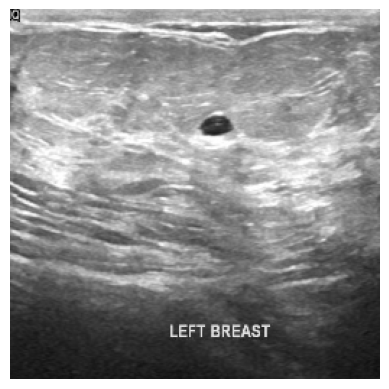

In [23]:
show_image(load_image(image_paths[0], SIZE))

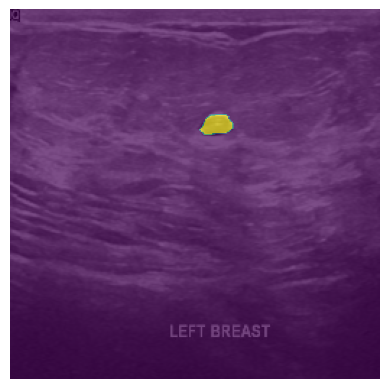

In [24]:
show_mask(load_image(image_paths[0], SIZE), load_image(mask_paths[0], SIZE)[:,:,0], alpha=0.7)

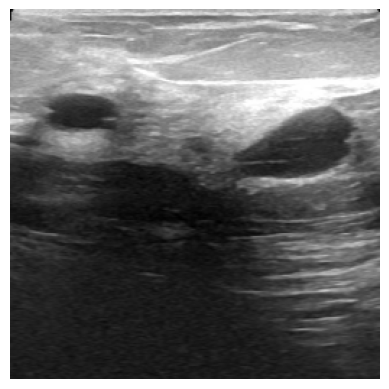

In [25]:
show_image(load_image('../input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/benign/benign (100).png', SIZE))

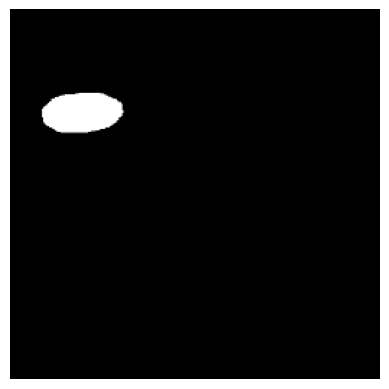

In [26]:
show_image(load_image('../input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/benign/benign (100)_mask_1.png', SIZE))

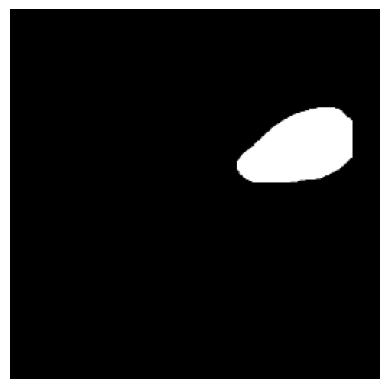

In [27]:
show_image(load_image('../input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/benign/benign (100)_mask.png', SIZE))

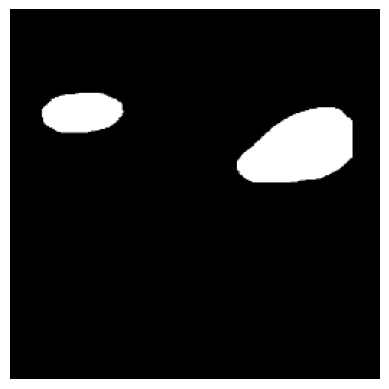

In [28]:
img = np.zeros((1,SIZE,SIZE,3))
mask1 = load_image('../input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/benign/benign (100)_mask_1.png', SIZE)
mask2 = load_image('../input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/benign/benign (100)_mask.png', SIZE)

img = img + mask1 + mask2
img = img[0,:,:,0]
show_image(img, cmap='gray')

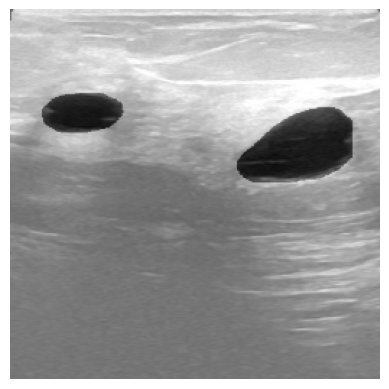

In [29]:
show_image(load_image('../input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/benign/benign (100).png', SIZE))
plt.imshow(img, cmap='binary',alpha=0.4)
plt.axis('off')
plt.show()

In [30]:
images = load_images(image_paths, SIZE)
masks = load_images(mask_paths, SIZE, mask=True)

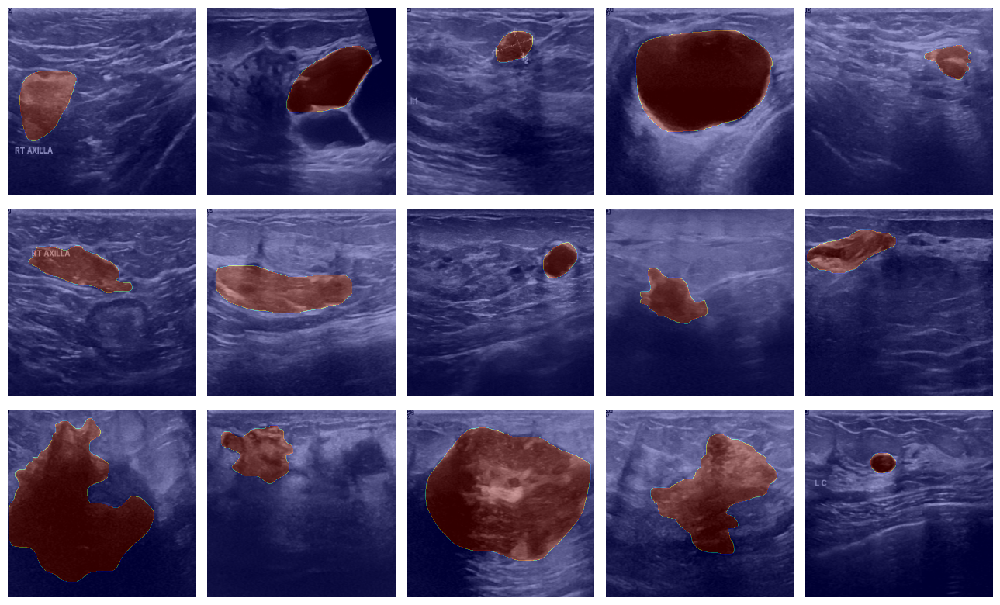

In [31]:
plt.figure(figsize=(13,8))
for i in range(15):
    plt.subplot(3,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='jet')
plt.tight_layout()
plt.show()

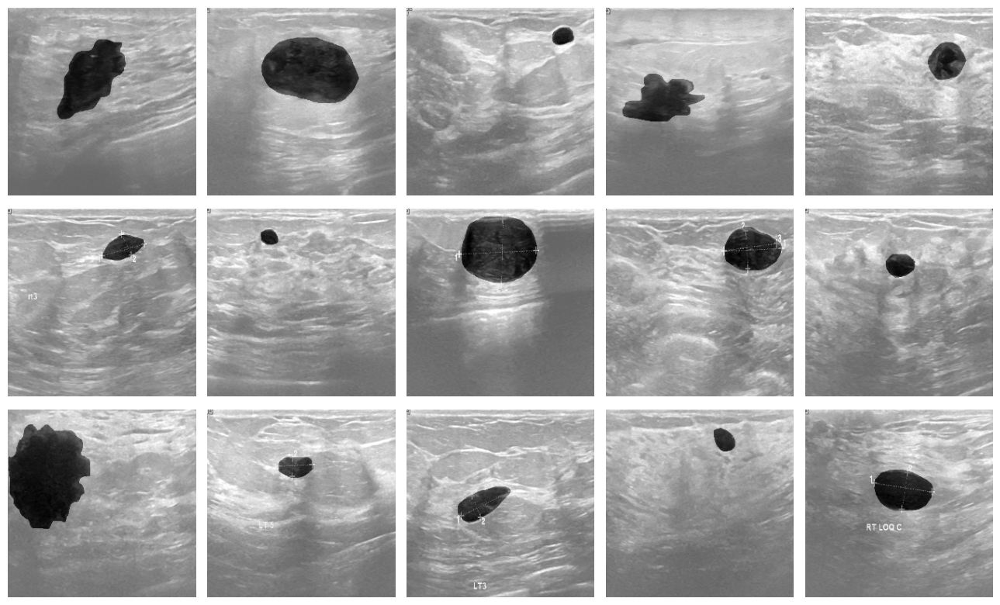

In [32]:
plt.figure(figsize=(13,8))
for i in range(15):
    plt.subplot(3,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='binary')
plt.tight_layout()
plt.show()

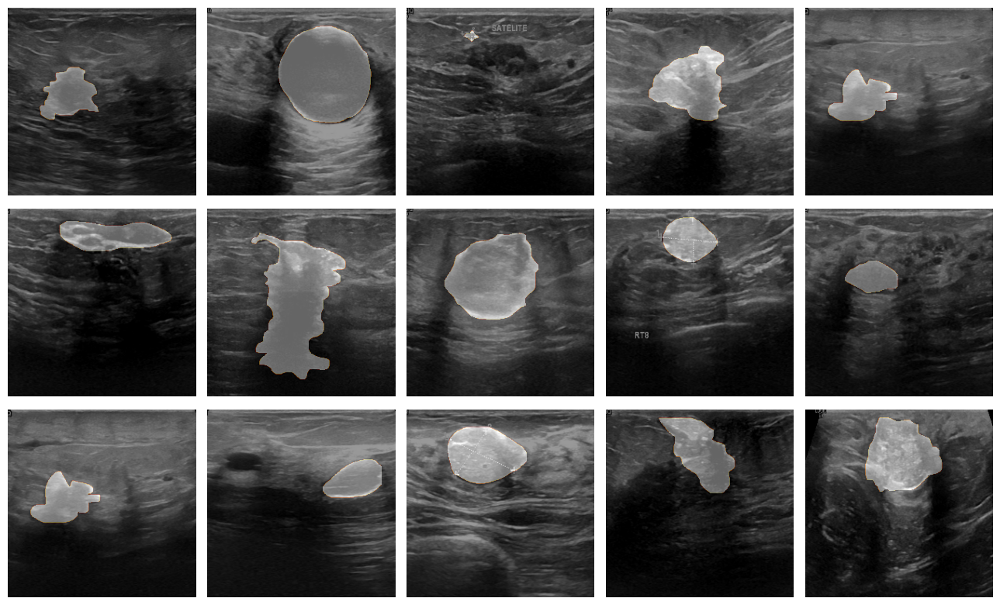

In [33]:
plt.figure(figsize=(13,8))
for i in range(15):
    plt.subplot(3,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='afmhot')
plt.tight_layout()
plt.show()

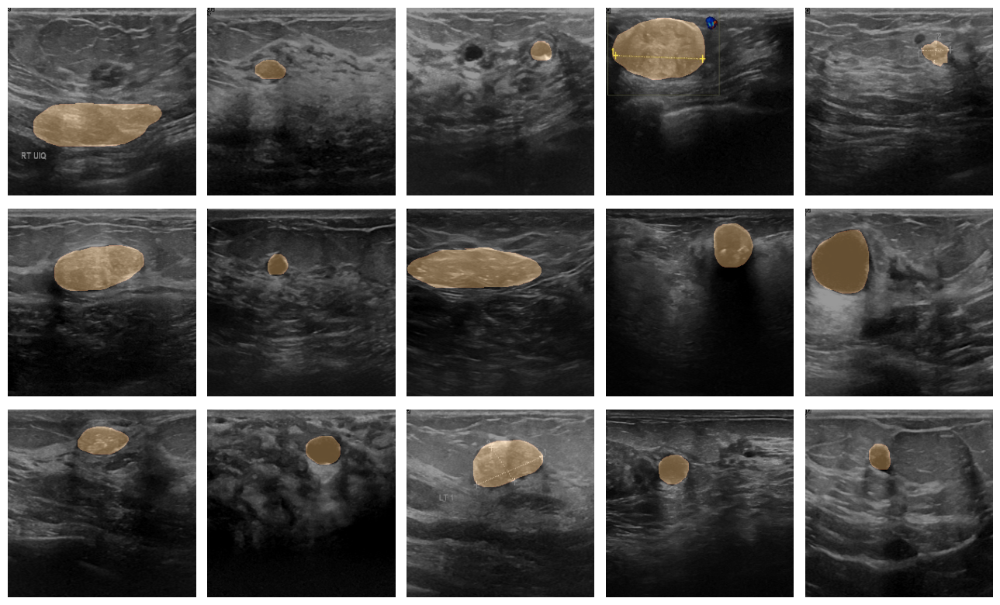

In [34]:
plt.figure(figsize=(13,8))
for i in range(15):
    plt.subplot(3,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='copper')
plt.tight_layout()
plt.show()

In [35]:
import tensorflow as tf
from tensorflow.keras.layers import (
    Conv2D, Dropout, MaxPool2D, UpSampling2D, Conv2DTranspose,
    BatchNormalization, Add, Multiply, concatenate, Input, Layer
)
from tensorflow.keras.models import Model
class EncoderBlock(Layer):

    def __init__(self, filters, rate, pooling=True, **kwargs):
        super(EncoderBlock, self).__init__(**kwargs)

        self.filters = filters
        self.rate = rate
        self.pooling = pooling

        self.c1 = Conv2D(filters, kernel_size=3, strides=1, padding='same', kernel_initializer='he_normal')
        self.bn1 = BatchNormalization()
        self.act1 = tf.keras.layers.Activation('relu')
        self.drop = Dropout(rate)
        self.c2 = Conv2D(filters, kernel_size=3, strides=1, padding='same', kernel_initializer='he_normal')
        self.bn2 = BatchNormalization()
        self.act2 = tf.keras.layers.Activation('relu')
        self.pool = MaxPool2D()

    def call(self, X):
        x = self.c1(X)
        x = self.bn1(x)
        x = self.act1(x)
        x = self.drop(x)
        x = self.c2(x)
        x = self.bn2(x)
        x = self.act2(x)
        if self.pooling:
            y = self.pool(x)
            return y, x
        else:
            return x

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            'rate':self.rate,
            'pooling':self.pooling
        }
class DecoderBlock(Layer):

    def __init__(self, filters, rate, **kwargs):
        super(DecoderBlock, self).__init__(**kwargs)

        self.filters = filters
        self.rate = rate

        self.up = Conv2DTranspose(filters, kernel_size=2, strides=2, padding='same')
        self.net = EncoderBlock(filters, rate, pooling=False)

    def call(self, X):
        X, skip_X = X
        x = self.up(X)
        c_ = concatenate([x, skip_X])
        x = self.net(c_)
        return x

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            'rate':self.rate,
        }
class AttentionGate(Layer):

    def __init__(self, filters, bn, **kwargs):
        super(AttentionGate, self).__init__(**kwargs)

        self.filters = filters
        self.bn = bn

        self.normal = Conv2D(filters, kernel_size=3, padding='same', activation='relu', kernel_initializer='he_normal')
        self.down = Conv2D(filters, kernel_size=3, strides=2, padding='same', activation='relu', kernel_initializer='he_normal')
        self.learn = Conv2D(1, kernel_size=1, padding='same', activation='sigmoid')
        self.resample = UpSampling2D(size=(2,2), interpolation='bilinear')
        self.BN = BatchNormalization()

    def call(self, X):
        X, skip_X = X

        x = self.normal(X)
        skip = self.down(skip_X)
        x = Add()([x, skip])
        x = self.learn(x)
        x = self.resample(x)
        f = Multiply()([x, skip_X])
        if self.bn:
            return self.BN(f)
        else:
            return f
        # return f

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            "bn":self.bn
        }

In [36]:
class ShowProgress(Callback):
    def on_epoch_end(self, epochs, logs=None):
        id = np.random.randint(200)
        # exp = GradCAM()
        image = images[id]
        mask = masks[id]
        pred_mask = self.model.predict(image[np.newaxis,...])
        plt.figure(figsize=(10,5))
        
        plt.subplot(1,3,1)
        plt.title("Original Input")
        plt.imshow(image)
        plt.axis('off')
        
        plt.subplot(1,3,1)
        plt.title("Original Mask")
        # show_mask(image, mask)
        plt.imshow(tf.squeeze(mask), cmap='gray')
        plt.axis('off')

        plt.subplot(1,3,2)
        plt.title("Predicted Mask")
        # show_mask(image, pred_mask)
        plt.imshow(tf.squeeze(pred_mask) > 0.5, cmap='gray') 
        plt.axis('off')

        plt.tight_layout()
        plt.show()

In [39]:
import tensorflow.keras.backend as K
import tensorflow as tf

def dice_coefficient(y_true, y_pred, smooth=1e-6):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)

    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def dice_loss(y_true, y_pred):
    return 1 - dice_coefficient(y_true, y_pred)

def tversky_loss(y_true, y_pred, alpha=0.7, beta=0.3, smooth=1e-6):
    y_true_f = K.flatten(tf.cast(y_true, tf.float32))
    y_pred_f = K.flatten(tf.cast(y_pred, tf.float32))
    TP = K.sum(y_true_f * y_pred_f)
    FP = K.sum((1 - y_true_f) * y_pred_f)
    FN = K.sum(y_true_f * (1 - y_pred_f))
    return 1 - ((TP + smooth) / (TP + alpha * FP + beta * FN + smooth))

def focal_tversky_loss(y_true, y_pred, alpha=0.7, beta=0.3, gamma=0.75):
    t_loss = tversky_loss(y_true, y_pred, alpha, beta)
    return K.pow(t_loss, gamma)

In [40]:
from tensorflow.keras.metrics import MeanIoU
# Inputs
input_layer = Input(shape=images.shape[-3:])

# Encoder
p1, c1 = EncoderBlock(32,0.1, name="Encoder1")(input_layer)
p2, c2 = EncoderBlock(64,0.1, name="Encoder2")(p1)
p3, c3 = EncoderBlock(128,0.2, name="Encoder3")(p2)
p4, c4 = EncoderBlock(256,0.2, name="Encoder4")(p3)

# Encoding
encoding = EncoderBlock(512,0.3, pooling=False, name="Encoding")(p4)

# Attention + Decoder

a1 = AttentionGate(256, bn=True, name="Attention1")([encoding, c4])
d1 = DecoderBlock(256,0.2, name="Decoder1")([encoding, a1])

a2 = AttentionGate(128, bn=True, name="Attention2")([d1, c3])
d2 = DecoderBlock(128,0.2, name="Decoder2")([d1, a2])

a3 = AttentionGate(64, bn=True, name="Attention3")([d2, c2])
d3 = DecoderBlock(64,0.1, name="Decoder3")([d2, a3])


a4 = AttentionGate(32, bn=True, name="Attention4")([d3, c1])
d4 = DecoderBlock(32,0.1, name="Decoder4")([d3, a4])

# Output 
output_layer = Conv2D(1, kernel_size=1, activation='sigmoid', padding='same')(d4)

# Model
model = Model(
    inputs=[input_layer],
    outputs=[output_layer]
)


In [41]:

# import tensorflow_addons as tfa
from tensorflow.keras.metrics import MeanIoU
# Compile
model.compile(
    optimizer=tf.keras.optimizers.AdamW(learning_rate=1e-4,weight_decay=1e-4),
    loss=focal_tversky_loss,
    metrics=['accuracy',dice_coefficient, MeanIoU(num_classes=2),tversky_loss]
)
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6
)
early_stop = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss', patience=10, restore_best_weights=True
)
# Callbacks
cb = [
    early_stop,
    lr_scheduler,
    # EarlyStopping(patience=3, restore_best_weight=True), # With Segmentation I trust on eyes rather than on metrics
    ModelCheckpoint("AttentionCustomUNet.h5", save_best_only=True),
    ShowProgress()
]

In [42]:
from sklearn.model_selection import train_test_split
# First, load all images and masks into arrays

images = load_images(image_paths, SIZE, mask=False)
masks  = load_images(mask_paths, SIZE, mask=True)

train_images, val_images, train_masks, val_masks = train_test_split(
    images, masks, test_size=0.2, random_state=42
)


In [43]:
# ⚙️ Config
BATCH_SIZE = 8

# ✅ Safe, TF-graph compatible augmentations
def augment_image_and_mask(image, mask):
    image = tf.image.convert_image_dtype(image, tf.float32)
    mask = tf.image.convert_image_dtype(mask, tf.float32)

    # random horizontal flip
    if tf.random.uniform(()) > 0.5:
        image = tf.image.flip_left_right(image)
        mask  = tf.image.flip_left_right(mask)

    # random vertical flip
    if tf.random.uniform(()) > 0.5:
        image = tf.image.flip_up_down(image)
        mask  = tf.image.flip_up_down(mask)

    # random 90° rotation
    k = tf.random.uniform(shape=[], minval=0, maxval=4, dtype=tf.int32)
    image = tf.image.rot90(image, k)
    mask  = tf.image.rot90(mask, k)

    # random brightness / contrast (image only)
    image = tf.image.random_brightness(image, 0.1)
    image = tf.image.random_contrast(image, 0.8, 1.2)

    # optional Gaussian noise (image only)
    if tf.random.uniform(()) > 0.7:
        noise = tf.random.normal(shape=tf.shape(image), mean=0.0, stddev=0.02)
        image = tf.clip_by_value(image + noise, 0.0, 1.0)
    if tf.random.uniform(()) > 0.5:
        image = tf.image.random_saturation(image, 0.8, 1.2)
    if tf.random.uniform(()) > 0.5:
        image = tf.image.random_hue(image, 0.02)
    if tf.random.uniform(()) > 0.5:
        noise = tf.random.normal(tf.shape(image), 0, 0.05)
        image = tf.clip_by_value(image + noise, 0.0, 1.0)

    return image, mask

In [44]:
# ✅ Build datasets
train_dataset = (
    tf.data.Dataset.from_tensor_slices((train_images, train_masks))
    .shuffle(buffer_size=len(train_images))
    .map(augment_image_and_mask, num_parallel_calls=tf.data.AUTOTUNE)
    .batch(BATCH_SIZE)
    .prefetch(tf.data.AUTOTUNE)
)

val_dataset = (
    tf.data.Dataset.from_tensor_slices((val_images, val_masks))
    .batch(BATCH_SIZE)
    .prefetch(tf.data.AUTOTUNE)
)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


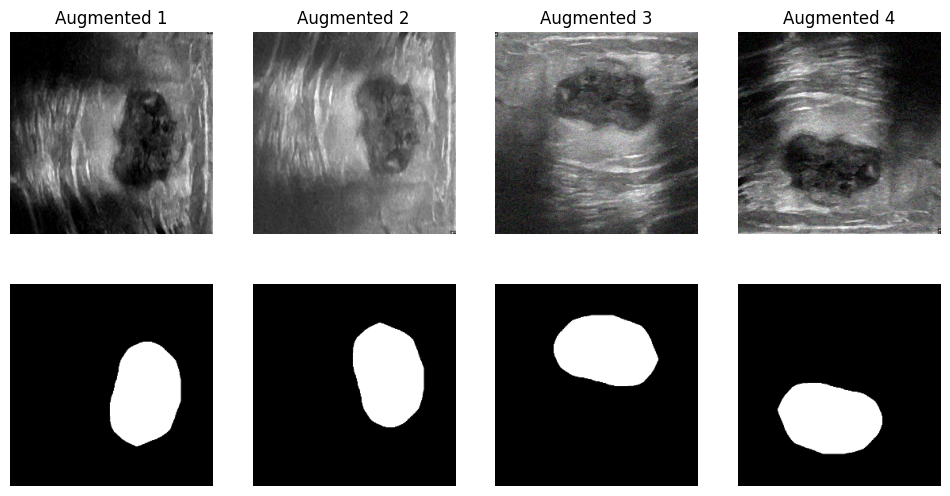

In [45]:
import matplotlib.pyplot as plt

# Take one image several times from the dataset
single_img = train_images[0]
single_mask = train_masks[0]

dataset_test = (
    tf.data.Dataset.from_tensors((single_img, single_mask))
    .repeat(4)
    .map(lambda x, y: augment_image_and_mask(x, y))
)

plt.figure(figsize=(12, 6))
for i, (img, msk) in enumerate(dataset_test.take(4)):
    plt.subplot(2,4,i+1)
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"Augmented {i+1}")

    plt.subplot(2,4,4+i+1)
    plt.imshow(tf.squeeze(msk), cmap='gray')
    plt.axis("off")


Epoch 1/40


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_80']
Received: inputs=Tensor(shape=(None, 256, 256, 3))
  warnings.warn(msg)
I0000 00:00:1762844217.305367     120 service.cc:148] XLA service 0x7b821c042d00 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1762844217.308368     120 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1762844217.308391     120 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1762844219.938041     120 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:1762844259.910133     120 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


64/65 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step - accuracy: 0.3324 - dice_coefficient: 0.1793 - loss: 0.8928 - mean_io_u: 0.4520 - tversky_loss: 0.8601

E0000 00:00:1762844287.157923     122 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1762844287.382494     122 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 785ms/step - accuracy: 0.3343 - dice_coefficient: 0.1795 - loss: 0.8926 - mean_io_u: 0.4520 - tversky_loss: 0.8599

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_80']
Received: inputs=Tensor(shape=(1, 256, 256, 3))
  warnings.warn(msg)


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


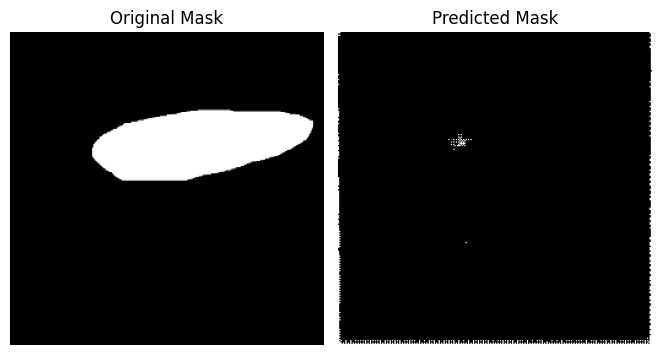

65/65 ━━━━━━━━━━━━━━━━━━━━ 129s 1s/step - accuracy: 0.3361 - dice_coefficient: 0.1797 - loss: 0.8925 - mean_io_u: 0.4521 - tversky_loss: 0.8598 - val_accuracy: 0.8942 - val_dice_coefficient: 0.1552 - val_loss: 0.9065 - val_mean_io_u: 0.4547 - val_tversky_loss: 0.8761 - learning_rate: 1.0000e-04
Epoch 2/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/steptep - accuracy: 0.7098 - dice_coefficient: 0.2701 - loss: 0.8334 - mean_io_u: 0.4534 - tversky_loss: 0.785


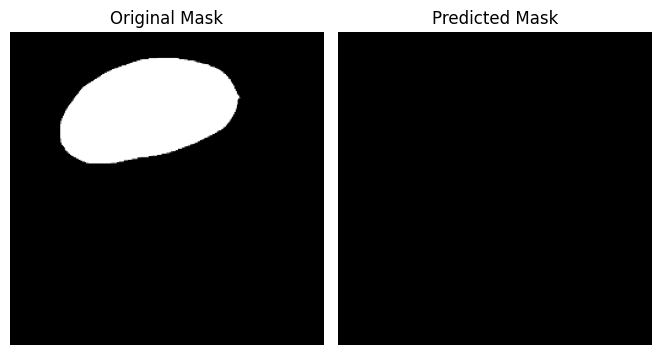

65/65 ━━━━━━━━━━━━━━━━━━━━ 16s 250ms/step - accuracy: 0.7103 - dice_coefficient: 0.2702 - loss: 0.8333 - mean_io_u: 0.4535 - tversky_loss: 0.7849 - val_accuracy: 0.9078 - val_dice_coefficient: 0.1374 - val_loss: 0.9117 - val_mean_io_u: 0.4547 - val_tversky_loss: 0.8817 - learning_rate: 1.0000e-04
Epoch 3/40
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step - accuracy: 0.7808 - dice_coefficient: 0.3159 - loss: 0.7983 - mean_io_u: 0.4527 - tversky_loss: 0.7421

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


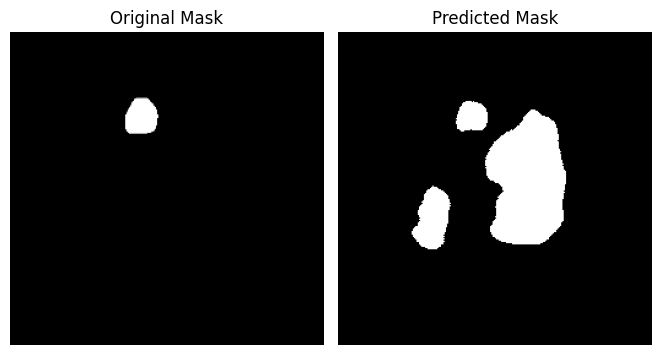

65/65 ━━━━━━━━━━━━━━━━━━━━ 18s 272ms/step - accuracy: 0.7810 - dice_coefficient: 0.3159 - loss: 0.7983 - mean_io_u: 0.4528 - tversky_loss: 0.7421 - val_accuracy: 0.8928 - val_dice_coefficient: 0.2465 - val_loss: 0.8351 - val_mean_io_u: 0.4547 - val_tversky_loss: 0.7875 - learning_rate: 1.0000e-04
Epoch 4/40
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - accuracy: 0.8256 - dice_coefficient: 0.3350 - loss: 0.7856 - mean_io_u: 0.4563 - tversky_loss: 0.7260

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


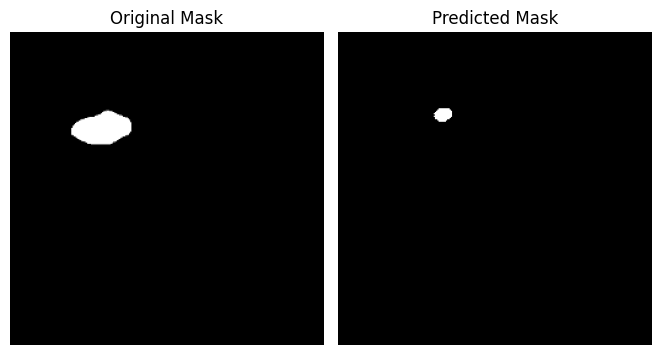

65/65 ━━━━━━━━━━━━━━━━━━━━ 19s 285ms/step - accuracy: 0.8255 - dice_coefficient: 0.3350 - loss: 0.7857 - mean_io_u: 0.4563 - tversky_loss: 0.7260 - val_accuracy: 0.9174 - val_dice_coefficient: 0.2468 - val_loss: 0.8260 - val_mean_io_u: 0.4547 - val_tversky_loss: 0.7766 - learning_rate: 1.0000e-04
Epoch 5/40
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step - accuracy: 0.8283 - dice_coefficient: 0.3753 - loss: 0.7529 - mean_io_u: 0.4492 - tversky_loss: 0.6865

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


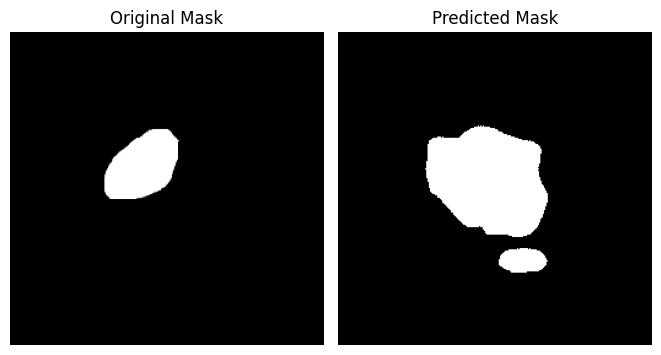

65/65 ━━━━━━━━━━━━━━━━━━━━ 18s 275ms/step - accuracy: 0.8283 - dice_coefficient: 0.3749 - loss: 0.7532 - mean_io_u: 0.4493 - tversky_loss: 0.6869 - val_accuracy: 0.8833 - val_dice_coefficient: 0.2673 - val_loss: 0.8160 - val_mean_io_u: 0.4547 - val_tversky_loss: 0.7646 - learning_rate: 1.0000e-04
Epoch 6/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/steptep - accuracy: 0.8393 - dice_coefficient: 0.3311 - loss: 0.7844 - mean_io_u: 0.4568 - tversky_loss: 0.725


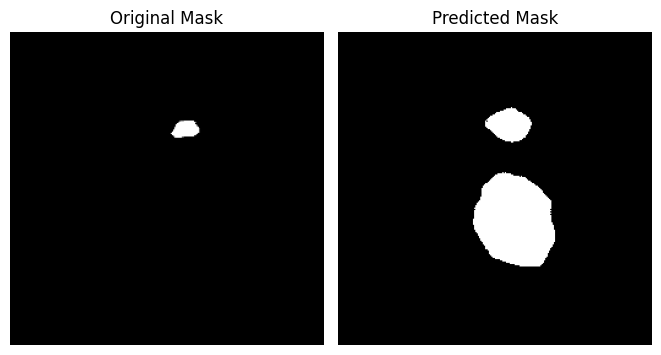

65/65 ━━━━━━━━━━━━━━━━━━━━ 17s 261ms/step - accuracy: 0.8393 - dice_coefficient: 0.3315 - loss: 0.7841 - mean_io_u: 0.4567 - tversky_loss: 0.7246 - val_accuracy: 0.8928 - val_dice_coefficient: 0.2623 - val_loss: 0.8181 - val_mean_io_u: 0.4547 - val_tversky_loss: 0.7669 - learning_rate: 1.0000e-04
Epoch 7/40
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step - accuracy: 0.8521 - dice_coefficient: 0.3813 - loss: 0.7463 - mean_io_u: 0.4548 - tversky_loss: 0.6783

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


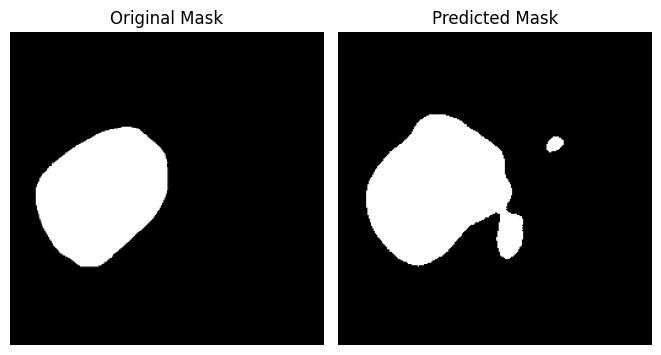

65/65 ━━━━━━━━━━━━━━━━━━━━ 18s 269ms/step - accuracy: 0.8522 - dice_coefficient: 0.3810 - loss: 0.7465 - mean_io_u: 0.4549 - tversky_loss: 0.6785 - val_accuracy: 0.8835 - val_dice_coefficient: 0.3115 - val_loss: 0.7843 - val_mean_io_u: 0.4548 - val_tversky_loss: 0.7269 - learning_rate: 1.0000e-04
Epoch 8/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/steptep - accuracy: 0.8698 - dice_coefficient: 0.3551 - loss: 0.7643 - mean_io_u: 0.4614 - tversky_loss: 0.700


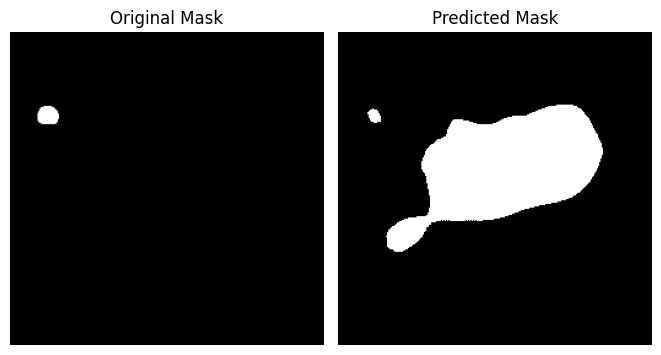

65/65 ━━━━━━━━━━━━━━━━━━━━ 17s 263ms/step - accuracy: 0.8698 - dice_coefficient: 0.3555 - loss: 0.7640 - mean_io_u: 0.4613 - tversky_loss: 0.7006 - val_accuracy: 0.7949 - val_dice_coefficient: 0.3246 - val_loss: 0.7961 - val_mean_io_u: 0.4548 - val_tversky_loss: 0.7297 - learning_rate: 1.0000e-04
Epoch 9/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/steptep - accuracy: 0.8616 - dice_coefficient: 0.3987 - loss: 0.7306 - mean_io_u: 0.4538 - tversky_loss: 0.659


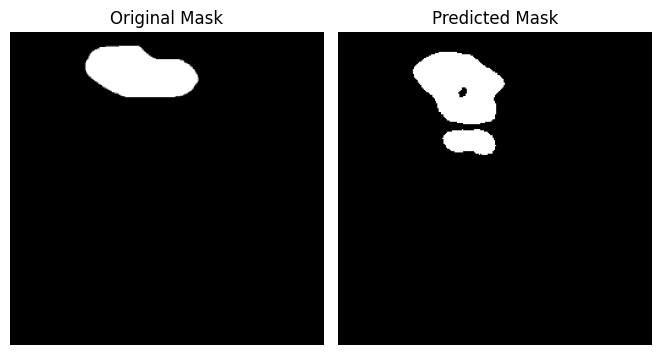

65/65 ━━━━━━━━━━━━━━━━━━━━ 17s 265ms/step - accuracy: 0.8619 - dice_coefficient: 0.3986 - loss: 0.7306 - mean_io_u: 0.4539 - tversky_loss: 0.6595 - val_accuracy: 0.9205 - val_dice_coefficient: 0.2958 - val_loss: 0.7869 - val_mean_io_u: 0.4549 - val_tversky_loss: 0.7217 - learning_rate: 1.0000e-04
Epoch 10/40
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step - accuracy: 0.8755 - dice_coefficient: 0.3998 - loss: 0.7273 - mean_io_u: 0.4578 - tversky_loss: 0.6555

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


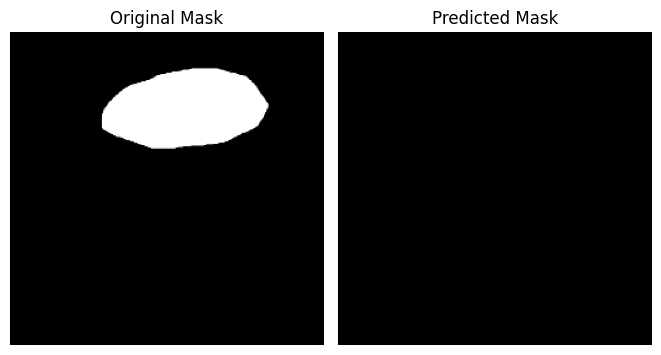

65/65 ━━━━━━━━━━━━━━━━━━━━ 18s 273ms/step - accuracy: 0.8756 - dice_coefficient: 0.4000 - loss: 0.7272 - mean_io_u: 0.4579 - tversky_loss: 0.6553 - val_accuracy: 0.9139 - val_dice_coefficient: 0.3500 - val_loss: 0.7455 - val_mean_io_u: 0.4552 - val_tversky_loss: 0.6725 - learning_rate: 1.0000e-04
Epoch 11/40
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step - accuracy: 0.8966 - dice_coefficient: 0.4284 - loss: 0.7017 - mean_io_u: 0.4669 - tversky_loss: 0.6256

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


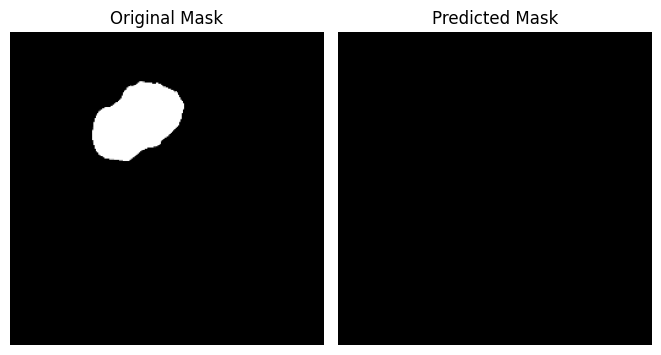

65/65 ━━━━━━━━━━━━━━━━━━━━ 18s 273ms/step - accuracy: 0.8965 - dice_coefficient: 0.4282 - loss: 0.7019 - mean_io_u: 0.4669 - tversky_loss: 0.6258 - val_accuracy: 0.9147 - val_dice_coefficient: 0.3471 - val_loss: 0.7420 - val_mean_io_u: 0.4568 - val_tversky_loss: 0.6731 - learning_rate: 1.0000e-04
Epoch 12/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/steptep - accuracy: 0.9017 - dice_coefficient: 0.4285 - loss: 0.7022 - mean_io_u: 0.4776 - tversky_loss: 0.626


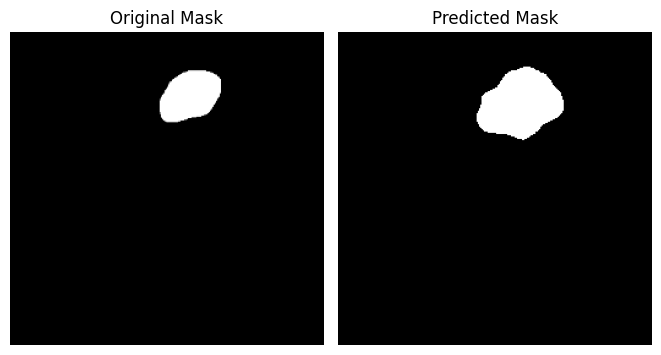

65/65 ━━━━━━━━━━━━━━━━━━━━ 17s 261ms/step - accuracy: 0.9016 - dice_coefficient: 0.4286 - loss: 0.7021 - mean_io_u: 0.4775 - tversky_loss: 0.6262 - val_accuracy: 0.9209 - val_dice_coefficient: 0.3018 - val_loss: 0.7657 - val_mean_io_u: 0.4564 - val_tversky_loss: 0.7018 - learning_rate: 1.0000e-04
Epoch 13/40
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step - accuracy: 0.9019 - dice_coefficient: 0.4249 - loss: 0.6997 - mean_io_u: 0.4846 - tversky_loss: 0.6237

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


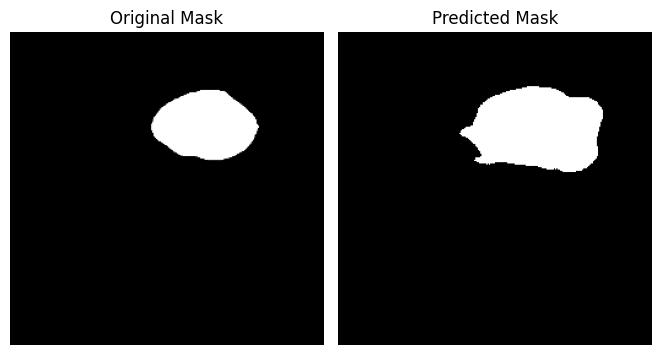

65/65 ━━━━━━━━━━━━━━━━━━━━ 18s 272ms/step - accuracy: 0.9018 - dice_coefficient: 0.4248 - loss: 0.6998 - mean_io_u: 0.4845 - tversky_loss: 0.6238 - val_accuracy: 0.9087 - val_dice_coefficient: 0.4097 - val_loss: 0.7001 - val_mean_io_u: 0.4713 - val_tversky_loss: 0.6225 - learning_rate: 1.0000e-04
Epoch 14/40
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step - accuracy: 0.9088 - dice_coefficient: 0.4507 - loss: 0.6760 - mean_io_u: 0.4965 - tversky_loss: 0.5965

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


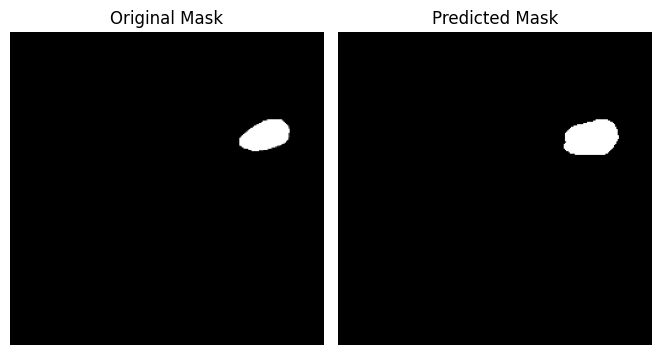

65/65 ━━━━━━━━━━━━━━━━━━━━ 18s 272ms/step - accuracy: 0.9088 - dice_coefficient: 0.4507 - loss: 0.6759 - mean_io_u: 0.4966 - tversky_loss: 0.5965 - val_accuracy: 0.9250 - val_dice_coefficient: 0.4120 - val_loss: 0.6928 - val_mean_io_u: 0.4704 - val_tversky_loss: 0.6062 - learning_rate: 1.0000e-04
Epoch 15/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/steptep - accuracy: 0.8883 - dice_coefficient: 0.4346 - loss: 0.6891 - mean_io_u: 0.4699 - tversky_loss: 0.611


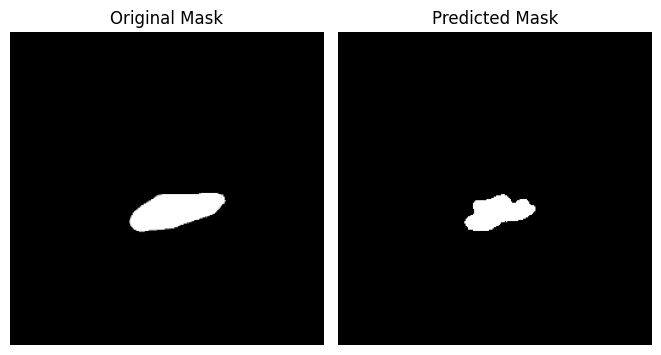

65/65 ━━━━━━━━━━━━━━━━━━━━ 17s 263ms/step - accuracy: 0.8885 - dice_coefficient: 0.4348 - loss: 0.6889 - mean_io_u: 0.4701 - tversky_loss: 0.6112 - val_accuracy: 0.9195 - val_dice_coefficient: 0.3555 - val_loss: 0.7228 - val_mean_io_u: 0.4732 - val_tversky_loss: 0.6538 - learning_rate: 1.0000e-04
Epoch 16/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/steptep - accuracy: 0.9095 - dice_coefficient: 0.4728 - loss: 0.6579 - mean_io_u: 0.4923 - tversky_loss: 0.574


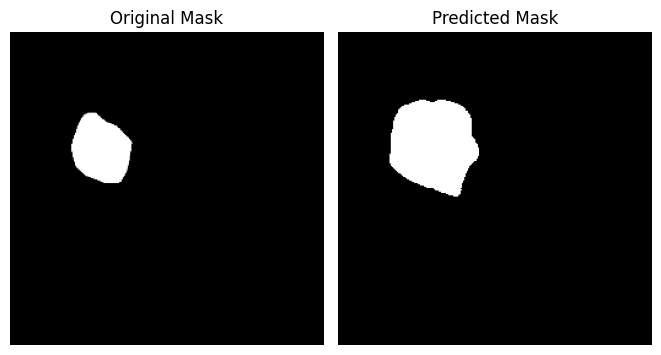

65/65 ━━━━━━━━━━━━━━━━━━━━ 17s 264ms/step - accuracy: 0.9095 - dice_coefficient: 0.4727 - loss: 0.6579 - mean_io_u: 0.4924 - tversky_loss: 0.5747 - val_accuracy: 0.9210 - val_dice_coefficient: 0.3519 - val_loss: 0.7246 - val_mean_io_u: 0.4629 - val_tversky_loss: 0.6540 - learning_rate: 1.0000e-04
Epoch 17/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/steptep - accuracy: 0.9175 - dice_coefficient: 0.5041 - loss: 0.6232 - mean_io_u: 0.5184 - tversky_loss: 0.535


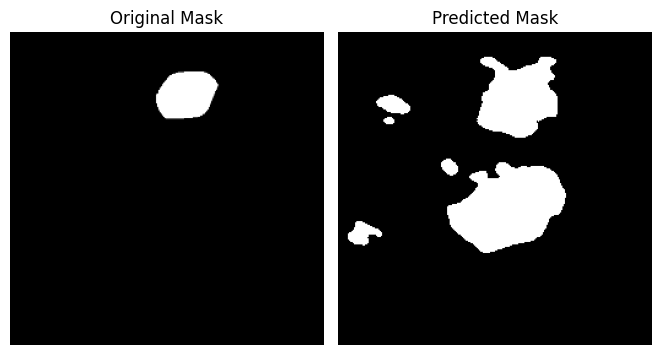

65/65 ━━━━━━━━━━━━━━━━━━━━ 17s 263ms/step - accuracy: 0.9175 - dice_coefficient: 0.5040 - loss: 0.6233 - mean_io_u: 0.5183 - tversky_loss: 0.5356 - val_accuracy: 0.8984 - val_dice_coefficient: 0.3986 - val_loss: 0.7098 - val_mean_io_u: 0.4879 - val_tversky_loss: 0.6338 - learning_rate: 1.0000e-04
Epoch 18/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/steptep - accuracy: 0.9244 - dice_coefficient: 0.5126 - loss: 0.6135 - mean_io_u: 0.5260 - tversky_loss: 0.523


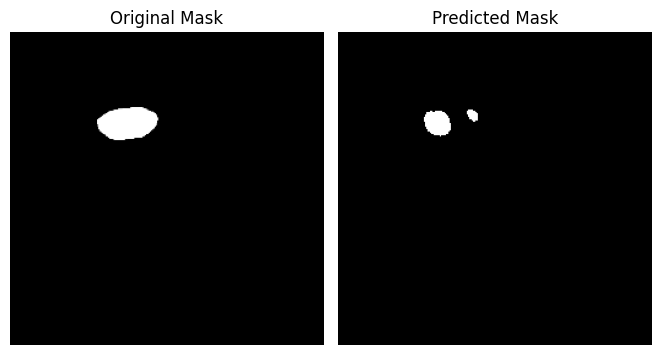

65/65 ━━━━━━━━━━━━━━━━━━━━ 17s 262ms/step - accuracy: 0.9244 - dice_coefficient: 0.5125 - loss: 0.6135 - mean_io_u: 0.5261 - tversky_loss: 0.5239 - val_accuracy: 0.9261 - val_dice_coefficient: 0.3324 - val_loss: 0.7332 - val_mean_io_u: 0.4625 - val_tversky_loss: 0.6599 - learning_rate: 1.0000e-04
Epoch 19/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/steptep - accuracy: 0.9243 - dice_coefficient: 0.5192 - loss: 0.5991 - mean_io_u: 0.5209 - tversky_loss: 0.508


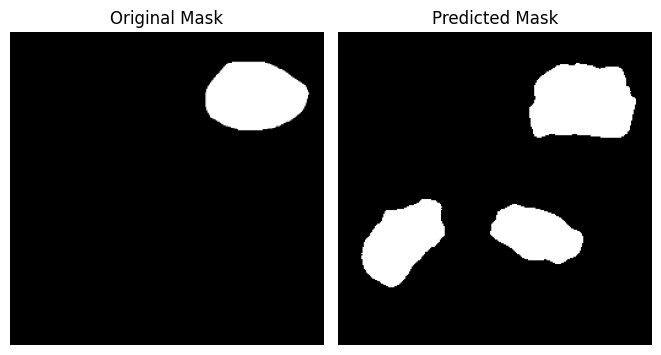

65/65 ━━━━━━━━━━━━━━━━━━━━ 17s 262ms/step - accuracy: 0.9243 - dice_coefficient: 0.5190 - loss: 0.5993 - mean_io_u: 0.5208 - tversky_loss: 0.5085 - val_accuracy: 0.9035 - val_dice_coefficient: 0.4129 - val_loss: 0.6995 - val_mean_io_u: 0.4708 - val_tversky_loss: 0.6128 - learning_rate: 1.0000e-04
Epoch 20/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/steptep - accuracy: 0.9170 - dice_coefficient: 0.4953 - loss: 0.6203 - mean_io_u: 0.5063 - tversky_loss: 0.531


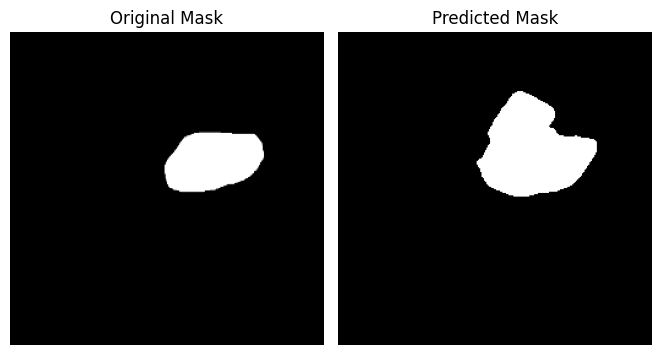

65/65 ━━━━━━━━━━━━━━━━━━━━ 17s 263ms/step - accuracy: 0.9171 - dice_coefficient: 0.4957 - loss: 0.6200 - mean_io_u: 0.5063 - tversky_loss: 0.5313 - val_accuracy: 0.9251 - val_dice_coefficient: 0.3242 - val_loss: 0.7232 - val_mean_io_u: 0.4551 - val_tversky_loss: 0.6533 - learning_rate: 5.0000e-05
Epoch 21/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/steptep - accuracy: 0.9276 - dice_coefficient: 0.5349 - loss: 0.5799 - mean_io_u: 0.5021 - tversky_loss: 0.487


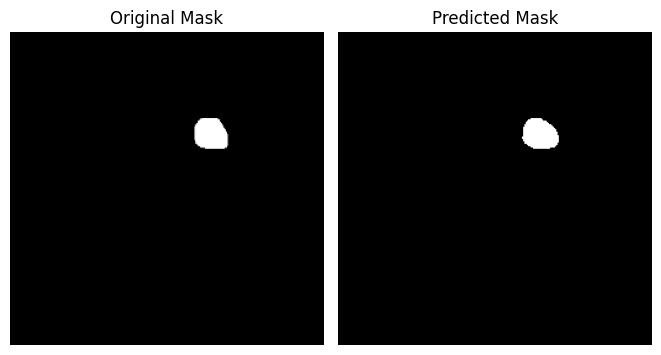

65/65 ━━━━━━━━━━━━━━━━━━━━ 17s 263ms/step - accuracy: 0.9276 - dice_coefficient: 0.5348 - loss: 0.5801 - mean_io_u: 0.5023 - tversky_loss: 0.4878 - val_accuracy: 0.9276 - val_dice_coefficient: 0.3383 - val_loss: 0.7061 - val_mean_io_u: 0.4550 - val_tversky_loss: 0.6333 - learning_rate: 5.0000e-05
Epoch 22/40
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step - accuracy: 0.9353 - dice_coefficient: 0.5762 - loss: 0.5366 - mean_io_u: 0.5096 - tversky_loss: 0.4390

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


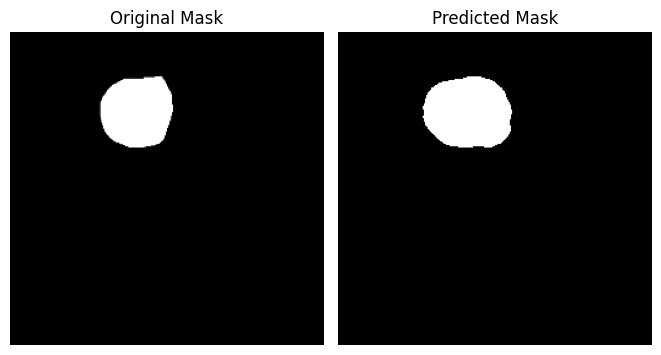

65/65 ━━━━━━━━━━━━━━━━━━━━ 18s 272ms/step - accuracy: 0.9353 - dice_coefficient: 0.5759 - loss: 0.5370 - mean_io_u: 0.5097 - tversky_loss: 0.4394 - val_accuracy: 0.9291 - val_dice_coefficient: 0.3701 - val_loss: 0.6788 - val_mean_io_u: 0.4563 - val_tversky_loss: 0.6025 - learning_rate: 5.0000e-05
Epoch 23/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/steptep - accuracy: 0.9372 - dice_coefficient: 0.5547 - loss: 0.5649 - mean_io_u: 0.5325 - tversky_loss: 0.469


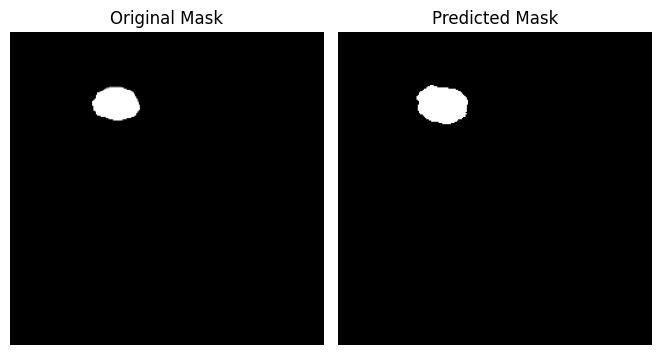

65/65 ━━━━━━━━━━━━━━━━━━━━ 17s 263ms/step - accuracy: 0.9372 - dice_coefficient: 0.5548 - loss: 0.5647 - mean_io_u: 0.5325 - tversky_loss: 0.4695 - val_accuracy: 0.9247 - val_dice_coefficient: 0.3174 - val_loss: 0.7171 - val_mean_io_u: 0.4594 - val_tversky_loss: 0.6458 - learning_rate: 5.0000e-05
Epoch 24/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/steptep - accuracy: 0.9424 - dice_coefficient: 0.5911 - loss: 0.5288 - mean_io_u: 0.5297 - tversky_loss: 0.432


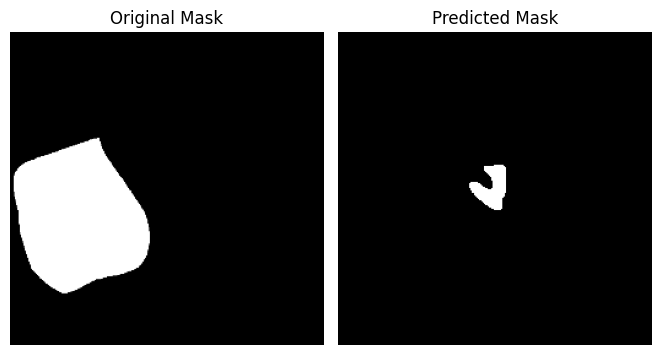

65/65 ━━━━━━━━━━━━━━━━━━━━ 17s 263ms/step - accuracy: 0.9424 - dice_coefficient: 0.5908 - loss: 0.5290 - mean_io_u: 0.5296 - tversky_loss: 0.4323 - val_accuracy: 0.9255 - val_dice_coefficient: 0.3224 - val_loss: 0.7154 - val_mean_io_u: 0.4642 - val_tversky_loss: 0.6391 - learning_rate: 5.0000e-05
Epoch 25/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/steptep - accuracy: 0.9393 - dice_coefficient: 0.5856 - loss: 0.5300 - mean_io_u: 0.5223 - tversky_loss: 0.432


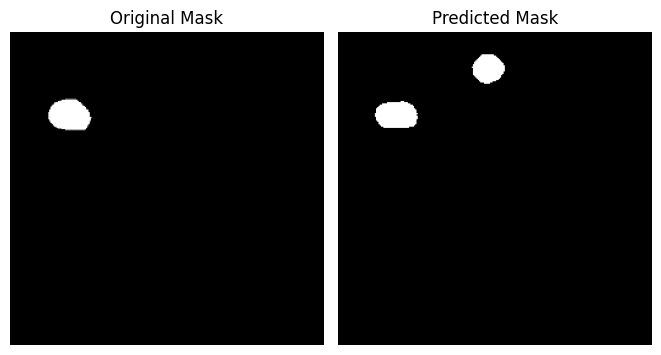

65/65 ━━━━━━━━━━━━━━━━━━━━ 17s 262ms/step - accuracy: 0.9393 - dice_coefficient: 0.5854 - loss: 0.5301 - mean_io_u: 0.5224 - tversky_loss: 0.4331 - val_accuracy: 0.9262 - val_dice_coefficient: 0.3377 - val_loss: 0.7072 - val_mean_io_u: 0.4700 - val_tversky_loss: 0.6226 - learning_rate: 5.0000e-05
Epoch 26/40
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step - accuracy: 0.9394 - dice_coefficient: 0.5934 - loss: 0.5229 - mean_io_u: 0.5191 - tversky_loss: 0.4243

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


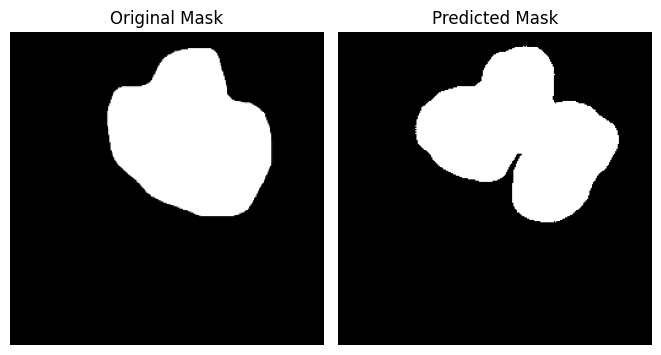

65/65 ━━━━━━━━━━━━━━━━━━━━ 18s 271ms/step - accuracy: 0.9395 - dice_coefficient: 0.5932 - loss: 0.5230 - mean_io_u: 0.5192 - tversky_loss: 0.4244 - val_accuracy: 0.9293 - val_dice_coefficient: 0.3846 - val_loss: 0.6631 - val_mean_io_u: 0.4730 - val_tversky_loss: 0.5780 - learning_rate: 5.0000e-05
Epoch 27/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/steptep - accuracy: 0.9387 - dice_coefficient: 0.5666 - loss: 0.5432 - mean_io_u: 0.5362 - tversky_loss: 0.446


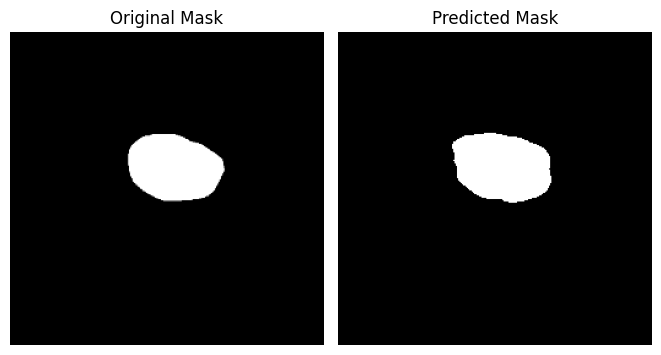

65/65 ━━━━━━━━━━━━━━━━━━━━ 17s 264ms/step - accuracy: 0.9387 - dice_coefficient: 0.5668 - loss: 0.5430 - mean_io_u: 0.5362 - tversky_loss: 0.4461 - val_accuracy: 0.9270 - val_dice_coefficient: 0.3525 - val_loss: 0.6892 - val_mean_io_u: 0.4698 - val_tversky_loss: 0.6042 - learning_rate: 5.0000e-05
Epoch 28/40
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - accuracy: 0.9413 - dice_coefficient: 0.6101 - loss: 0.5067 - mean_io_u: 0.5128 - tversky_loss: 0.4072

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


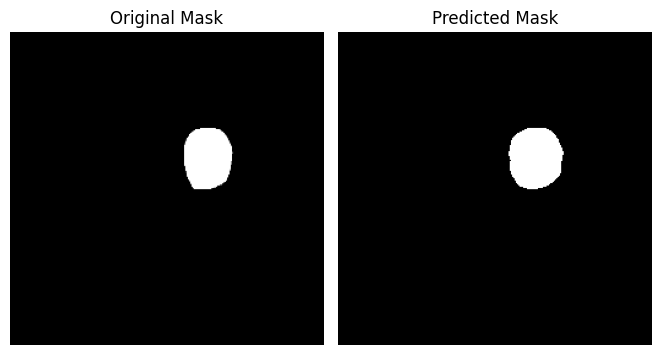

65/65 ━━━━━━━━━━━━━━━━━━━━ 18s 274ms/step - accuracy: 0.9412 - dice_coefficient: 0.6097 - loss: 0.5070 - mean_io_u: 0.5129 - tversky_loss: 0.4075 - val_accuracy: 0.9297 - val_dice_coefficient: 0.3905 - val_loss: 0.6530 - val_mean_io_u: 0.4668 - val_tversky_loss: 0.5677 - learning_rate: 5.0000e-05
Epoch 29/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/steptep - accuracy: 0.9333 - dice_coefficient: 0.5702 - loss: 0.5294 - mean_io_u: 0.5242 - tversky_loss: 0.432


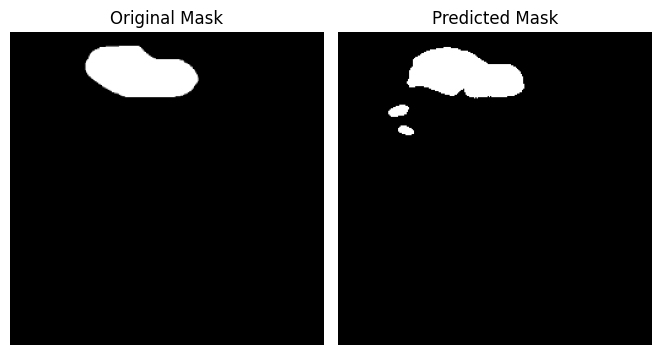

65/65 ━━━━━━━━━━━━━━━━━━━━ 17s 263ms/step - accuracy: 0.9334 - dice_coefficient: 0.5705 - loss: 0.5292 - mean_io_u: 0.5243 - tversky_loss: 0.4320 - val_accuracy: 0.9294 - val_dice_coefficient: 0.3802 - val_loss: 0.6575 - val_mean_io_u: 0.4571 - val_tversky_loss: 0.5740 - learning_rate: 5.0000e-05
Epoch 30/40
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step - accuracy: 0.9364 - dice_coefficient: 0.5845 - loss: 0.5217 - mean_io_u: 0.5310 - tversky_loss: 0.4234

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


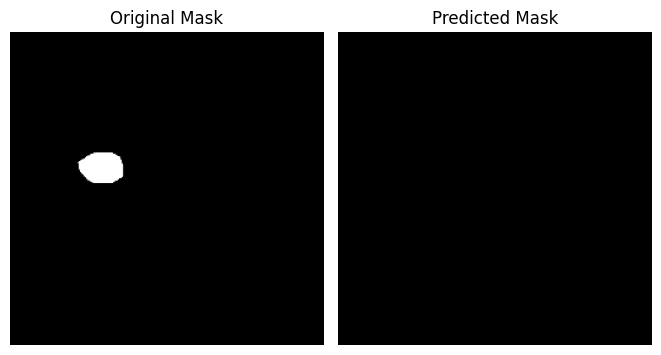

65/65 ━━━━━━━━━━━━━━━━━━━━ 18s 273ms/step - accuracy: 0.9364 - dice_coefficient: 0.5846 - loss: 0.5216 - mean_io_u: 0.5309 - tversky_loss: 0.4233 - val_accuracy: 0.9332 - val_dice_coefficient: 0.4404 - val_loss: 0.6123 - val_mean_io_u: 0.4740 - val_tversky_loss: 0.5220 - learning_rate: 5.0000e-05
Epoch 31/40
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step - accuracy: 0.9371 - dice_coefficient: 0.5875 - loss: 0.5146 - mean_io_u: 0.5217 - tversky_loss: 0.4177

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


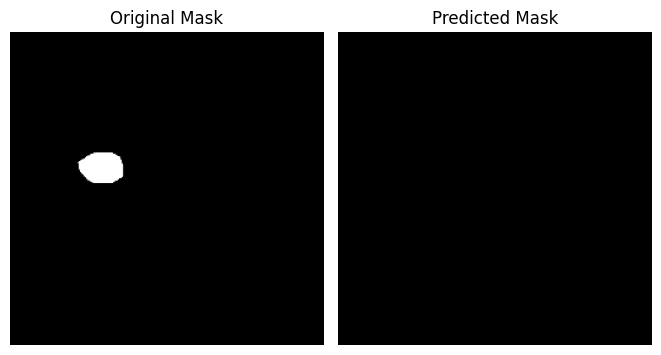

65/65 ━━━━━━━━━━━━━━━━━━━━ 18s 273ms/step - accuracy: 0.9371 - dice_coefficient: 0.5876 - loss: 0.5146 - mean_io_u: 0.5217 - tversky_loss: 0.4176 - val_accuracy: 0.9353 - val_dice_coefficient: 0.4515 - val_loss: 0.5991 - val_mean_io_u: 0.4633 - val_tversky_loss: 0.5039 - learning_rate: 5.0000e-05
Epoch 32/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/steptep - accuracy: 0.9424 - dice_coefficient: 0.5942 - loss: 0.5104 - mean_io_u: 0.5463 - tversky_loss: 0.412


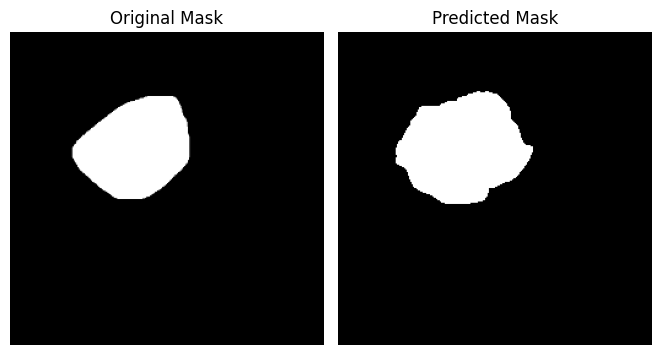

65/65 ━━━━━━━━━━━━━━━━━━━━ 17s 263ms/step - accuracy: 0.9424 - dice_coefficient: 0.5945 - loss: 0.5101 - mean_io_u: 0.5461 - tversky_loss: 0.4122 - val_accuracy: 0.9316 - val_dice_coefficient: 0.4129 - val_loss: 0.6281 - val_mean_io_u: 0.4627 - val_tversky_loss: 0.5362 - learning_rate: 5.0000e-05
Epoch 33/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/steptep - accuracy: 0.9380 - dice_coefficient: 0.5977 - loss: 0.4979 - mean_io_u: 0.5287 - tversky_loss: 0.399


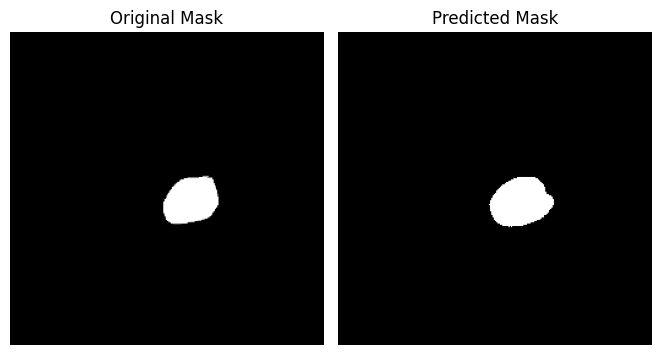

65/65 ━━━━━━━━━━━━━━━━━━━━ 17s 263ms/step - accuracy: 0.9380 - dice_coefficient: 0.5977 - loss: 0.4980 - mean_io_u: 0.5288 - tversky_loss: 0.3993 - val_accuracy: 0.9316 - val_dice_coefficient: 0.4126 - val_loss: 0.6243 - val_mean_io_u: 0.4597 - val_tversky_loss: 0.5367 - learning_rate: 5.0000e-05
Epoch 34/40
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step - accuracy: 0.9348 - dice_coefficient: 0.5876 - loss: 0.5103 - mean_io_u: 0.5210 - tversky_loss: 0.4122

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


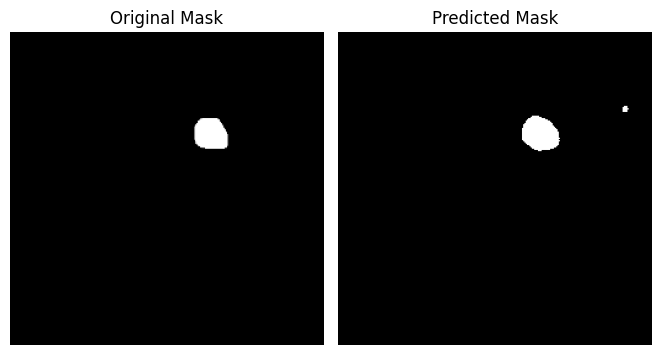

65/65 ━━━━━━━━━━━━━━━━━━━━ 18s 273ms/step - accuracy: 0.9349 - dice_coefficient: 0.5879 - loss: 0.5100 - mean_io_u: 0.5211 - tversky_loss: 0.4119 - val_accuracy: 0.9342 - val_dice_coefficient: 0.4598 - val_loss: 0.5921 - val_mean_io_u: 0.4792 - val_tversky_loss: 0.4948 - learning_rate: 5.0000e-05
Epoch 35/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/steptep - accuracy: 0.9467 - dice_coefficient: 0.6345 - loss: 0.4721 - mean_io_u: 0.5372 - tversky_loss: 0.371


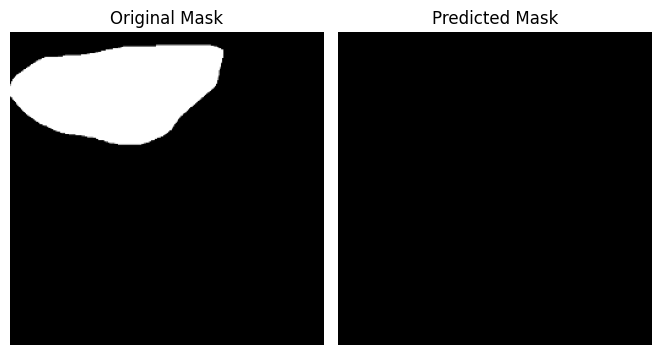

65/65 ━━━━━━━━━━━━━━━━━━━━ 17s 264ms/step - accuracy: 0.9467 - dice_coefficient: 0.6343 - loss: 0.4722 - mean_io_u: 0.5371 - tversky_loss: 0.3713 - val_accuracy: 0.9296 - val_dice_coefficient: 0.3896 - val_loss: 0.6433 - val_mean_io_u: 0.4674 - val_tversky_loss: 0.5545 - learning_rate: 5.0000e-05
Epoch 36/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/steptep - accuracy: 0.9500 - dice_coefficient: 0.6360 - loss: 0.4705 - mean_io_u: 0.5638 - tversky_loss: 0.369


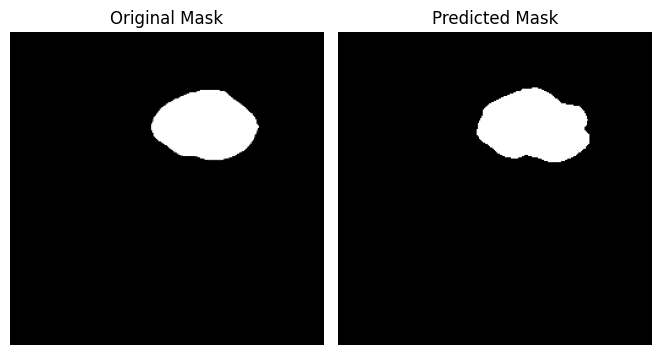

65/65 ━━━━━━━━━━━━━━━━━━━━ 17s 264ms/step - accuracy: 0.9499 - dice_coefficient: 0.6359 - loss: 0.4706 - mean_io_u: 0.5633 - tversky_loss: 0.3696 - val_accuracy: 0.9323 - val_dice_coefficient: 0.4244 - val_loss: 0.6111 - val_mean_io_u: 0.4640 - val_tversky_loss: 0.5177 - learning_rate: 5.0000e-05
Epoch 37/40
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step - accuracy: 0.9449 - dice_coefficient: 0.6407 - loss: 0.4559 - mean_io_u: 0.5268 - tversky_loss: 0.3564

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


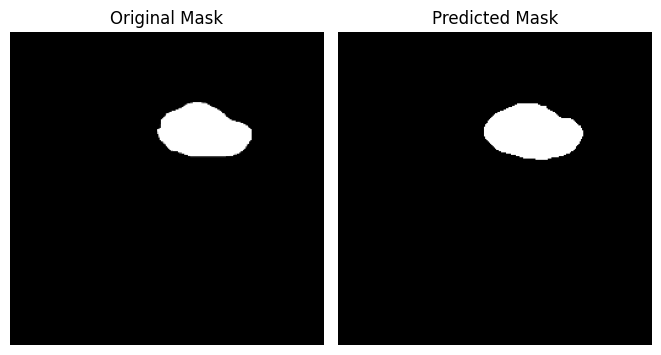

65/65 ━━━━━━━━━━━━━━━━━━━━ 18s 273ms/step - accuracy: 0.9448 - dice_coefficient: 0.6405 - loss: 0.4561 - mean_io_u: 0.5268 - tversky_loss: 0.3566 - val_accuracy: 0.9329 - val_dice_coefficient: 0.4622 - val_loss: 0.5890 - val_mean_io_u: 0.4628 - val_tversky_loss: 0.4899 - learning_rate: 5.0000e-05
Epoch 38/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/steptep - accuracy: 0.9383 - dice_coefficient: 0.6029 - loss: 0.4918 - mean_io_u: 0.5385 - tversky_loss: 0.391


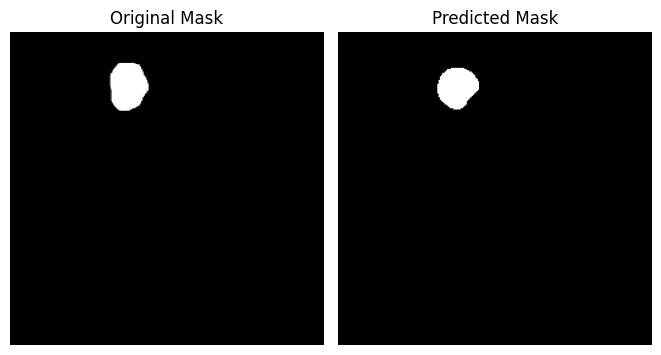

65/65 ━━━━━━━━━━━━━━━━━━━━ 17s 263ms/step - accuracy: 0.9383 - dice_coefficient: 0.6029 - loss: 0.4918 - mean_io_u: 0.5385 - tversky_loss: 0.3916 - val_accuracy: 0.9284 - val_dice_coefficient: 0.3727 - val_loss: 0.6484 - val_mean_io_u: 0.4691 - val_tversky_loss: 0.5629 - learning_rate: 5.0000e-05
Epoch 39/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/steptep - accuracy: 0.9473 - dice_coefficient: 0.6286 - loss: 0.4609 - mean_io_u: 0.5615 - tversky_loss: 0.359


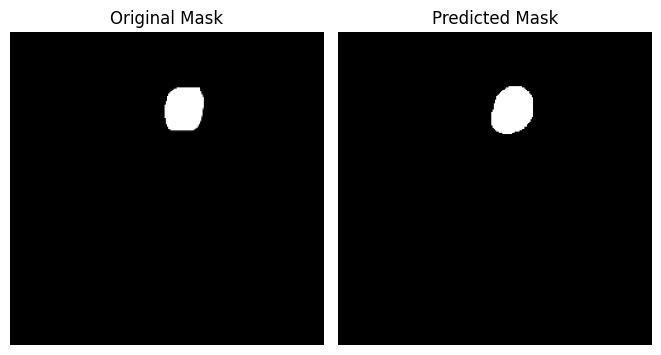

65/65 ━━━━━━━━━━━━━━━━━━━━ 17s 264ms/step - accuracy: 0.9473 - dice_coefficient: 0.6284 - loss: 0.4611 - mean_io_u: 0.5612 - tversky_loss: 0.3602 - val_accuracy: 0.9270 - val_dice_coefficient: 0.3510 - val_loss: 0.6608 - val_mean_io_u: 0.4649 - val_tversky_loss: 0.5828 - learning_rate: 5.0000e-05
Epoch 40/40
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step - accuracy: 0.9479 - dice_coefficient: 0.6406 - loss: 0.4589 - mean_io_u: 0.5513 - tversky_loss: 0.3595

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


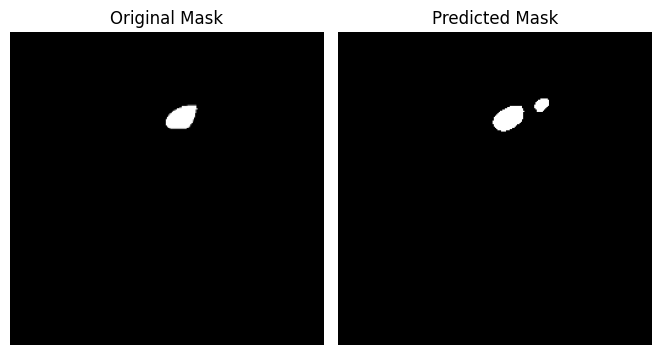

65/65 ━━━━━━━━━━━━━━━━━━━━ 18s 273ms/step - accuracy: 0.9479 - dice_coefficient: 0.6405 - loss: 0.4590 - mean_io_u: 0.5512 - tversky_loss: 0.3596 - val_accuracy: 0.9317 - val_dice_coefficient: 0.4616 - val_loss: 0.5855 - val_mean_io_u: 0.4881 - val_tversky_loss: 0.4858 - learning_rate: 5.0000e-05


In [46]:
# ✅ Train the model
results = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=40,
    callbacks=cb
)

In [56]:
predictions = model.predict(val_images)
pred_masks = (predictions > 0.5).astype(np.uint8)
def dice_coefficient_np(y_true, y_pred, smooth=1e-6):
    y_true_f = y_true.flatten()
    y_pred_f = y_pred.flatten()
    intersection = np.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (np.sum(y_true_f) + np.sum(y_pred_f) + smooth)

def iou_score_np(y_true, y_pred, smooth=1e-6):
    y_true_f = y_true.flatten()
    y_pred_f = y_pred.flatten()
    intersection = np.sum(y_true_f * y_pred_f)
    union = np.sum(y_true_f) + np.sum(y_pred_f) - intersection
    return (intersection + smooth) / (union + smooth)
def tversky_index_np(y_true, y_pred, alpha=0.3, beta=0.7, smooth=1e-6):
    y_true_f = y_true.flatten()
    y_pred_f = y_pred.flatten()
    
    # Convert to binary (in case of probabilities)
    y_true_f = (y_true_f > 0.5).astype(np.float32)
    y_pred_f = (y_pred_f > 0.5).astype(np.float32)

    TP = np.sum(y_true_f * y_pred_f)
    FP = np.sum(y_pred_f * (1 - y_true_f))
    FN = np.sum((1 - y_pred_f) * y_true_f)

    tversky = (TP + smooth) / (TP + alpha * FP + beta * FN + smooth)
    return tversky
dice_scores = [dice_coefficient_np(y_true, y_pred) for y_true, y_pred in zip(val_masks, pred_masks)]
iou_scores = [iou_score_np(y_true, y_pred) for y_true, y_pred in zip(val_masks, pred_masks)]
tversky_scores = [tversky_index_np(y_true, y_pred) for y_true, y_pred in zip(val_masks, pred_masks)]

print("Validation mean Dice:", np.mean(dice_scores))
print("Validation mean IoU:", np.mean(iou_scores))
print('Validation mean travesky :',np.mean(tversky_scores))

5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 178ms/step
Validation mean Dice: 0.5189567147412935
Validation mean IoU: 0.4448692232217975
Validation mean travesky : 0.5233833439085622


In [57]:
print("Validation median Dice:", np.median(dice_scores))
print("Validation median IoU:", np.median(iou_scores))
print("Validation median travesky:", np.median(tversky_scores))


Validation median Dice: 0.6723123135321256
Validation median IoU: 0.506378500362715
Validation median travesky: 0.6709111944729667


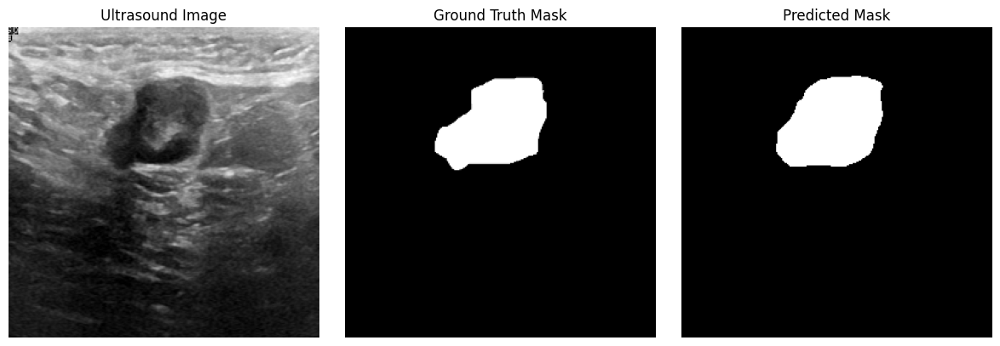

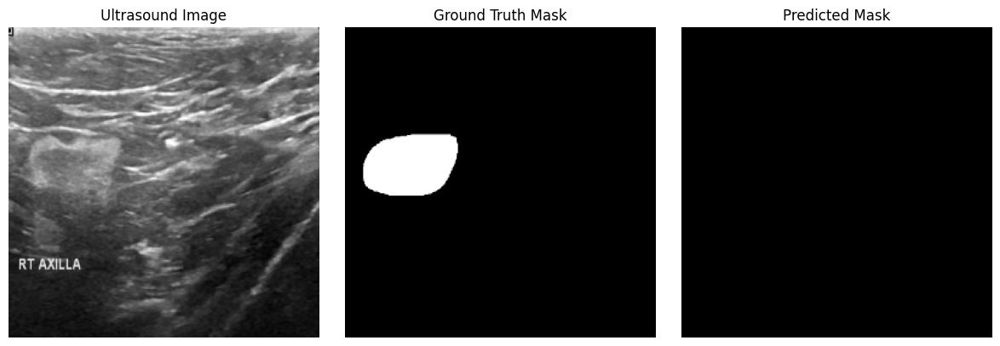

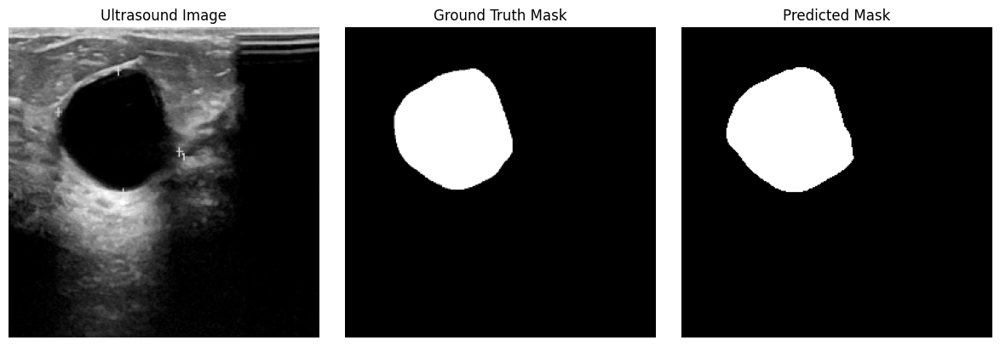

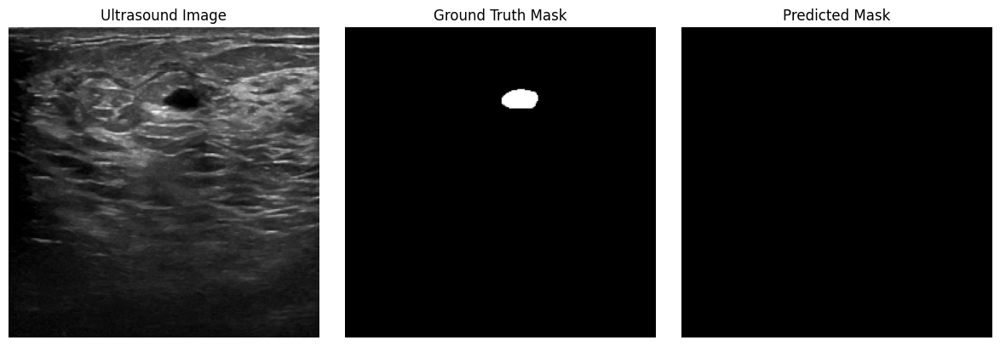

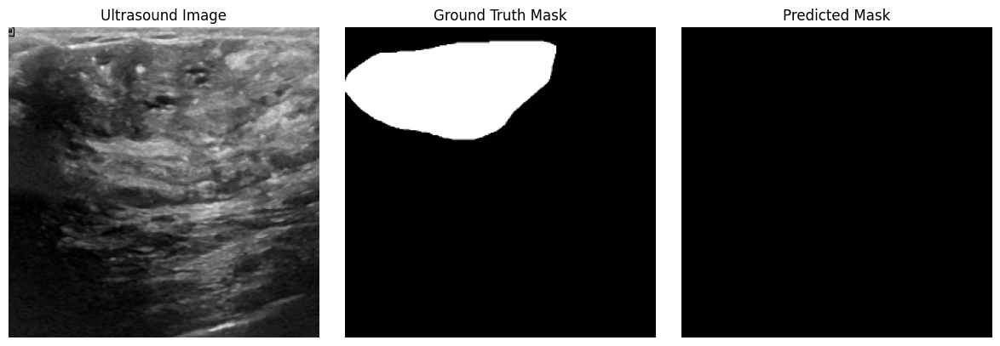

...

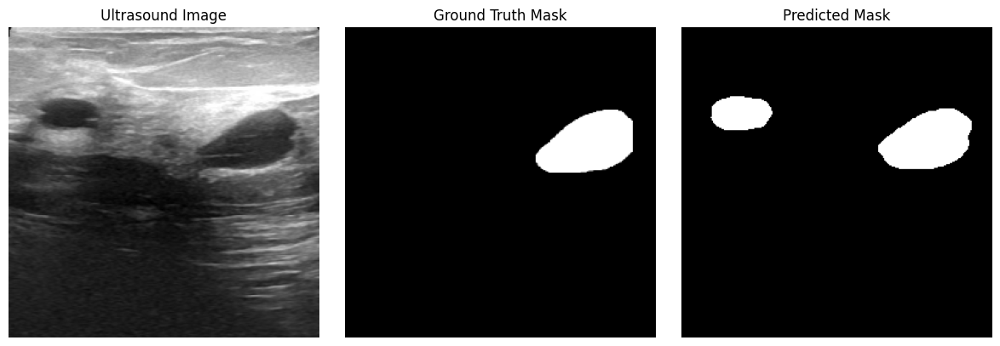

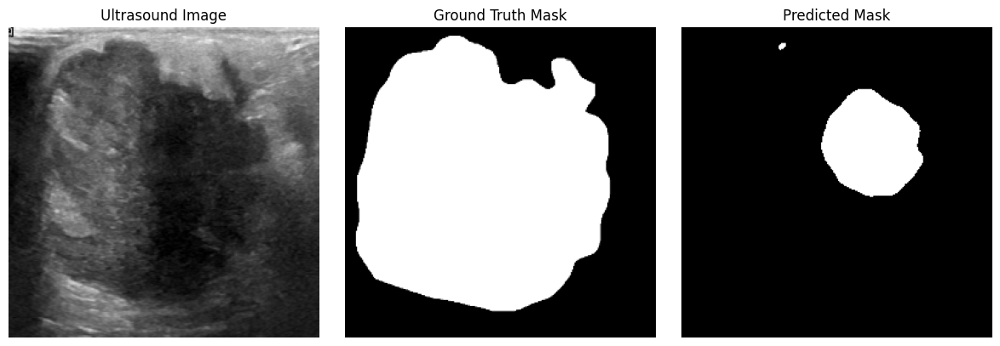

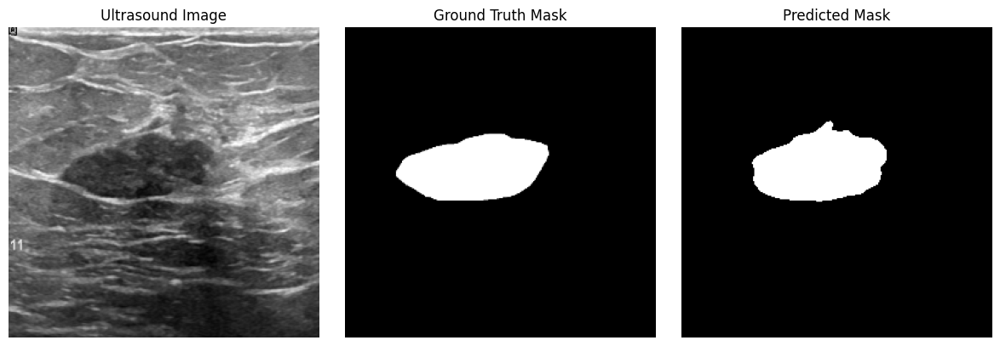

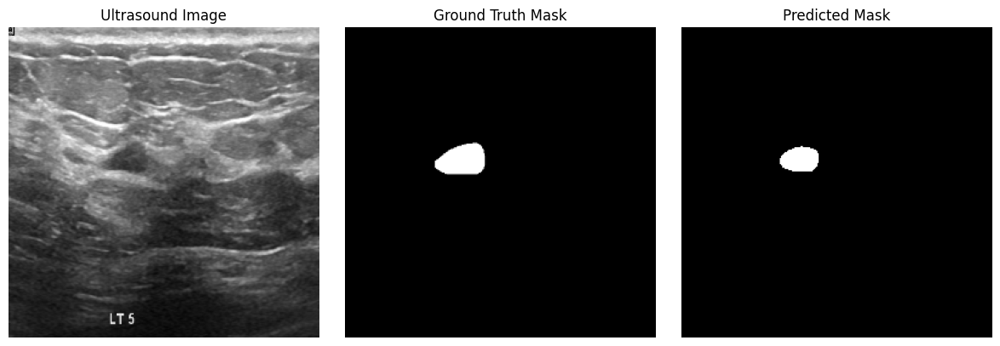

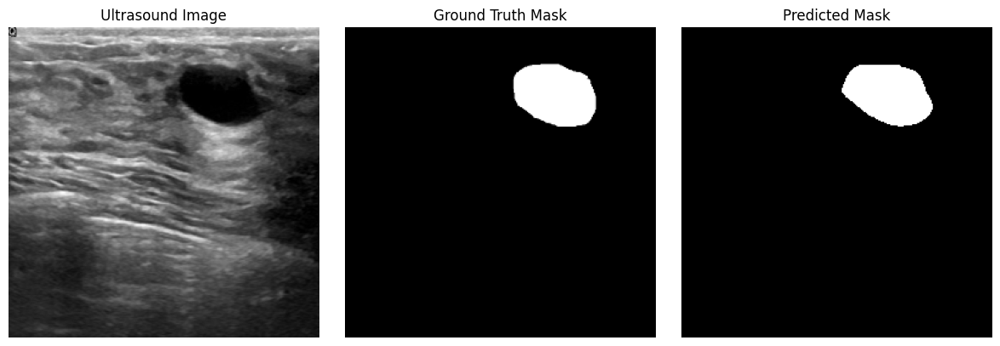

In [52]:
import matplotlib.pyplot as plt

for i in range(50):  # Show 3 samples
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(val_images[i], cmap='gray')
    plt.title('Ultrasound Image')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(np.squeeze(val_masks[i]), cmap='gray')
    plt.title('Ground Truth Mask')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(np.squeeze(pred_masks[i]), cmap='gray')
    plt.title('Predicted Mask')
    plt.axis('off')

    plt.tight_layout()
    plt.show()


In [ ]:
loss, accuracy, iou, val_loss, val_accuracy, val_iou = results.history.values()
plt.figure(figsize=(20,8))

plt.subplot(1,3,1)
plt.title("Model Loss")
plt.plot(loss, label="Training")
plt.plot(val_loss, label="Validtion")
plt.legend()
plt.grid()

plt.subplot(1,3,2)
plt.title("Model Accuracy")
plt.plot(accuracy, label="Training")
plt.plot(val_accuracy, label="Validtion")
plt.legend()
plt.grid()

plt.subplot(1,3,3)
plt.title("Model IoU")
plt.plot(iou, label="Training")
plt.plot(val_iou, label="Validtion")
plt.legend()
plt.grid()

plt.show()
